# Advance Lane Finding

In [1]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
%matplotlib inline

# Camera Calibration

This section is about calibrating the camera.  Images produced by cameras with lenses have distortion due to the face that the lens is not perfect and the senors used to collect the light is finitie in size.  Using images of a regular square patterns like a checker board allow for the measurement of the distortion.   Once this distortion is measured, images can to transformed to reverse the distortion.

Below is the code and resulting images for the calibartion of the camera used in this project.

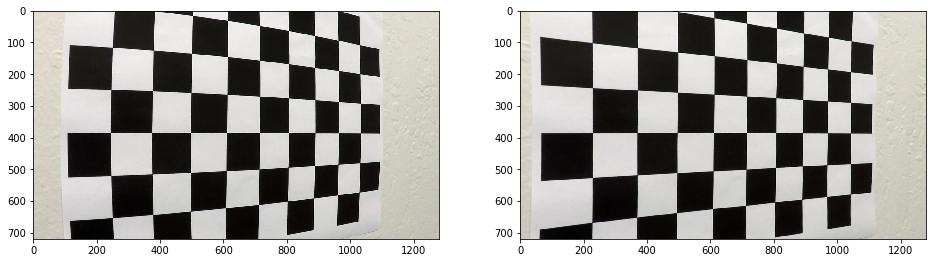

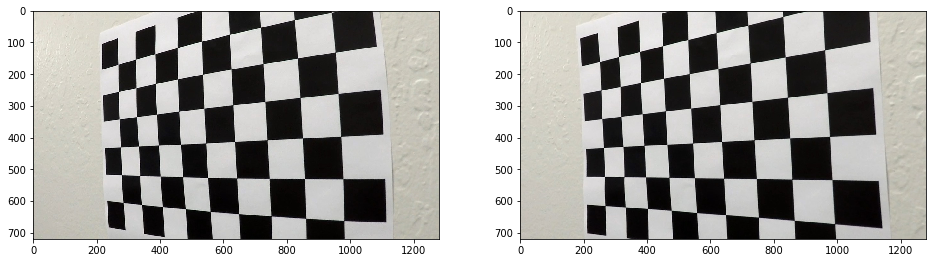

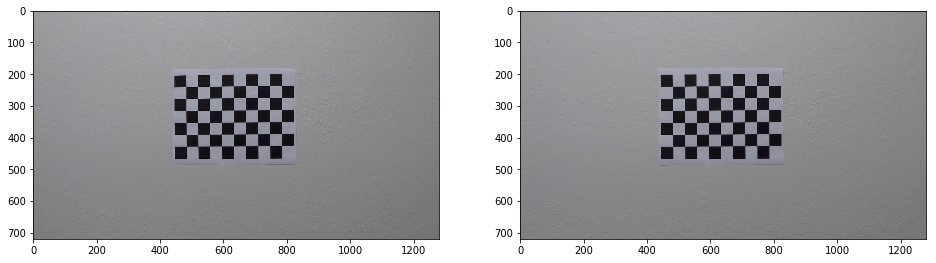

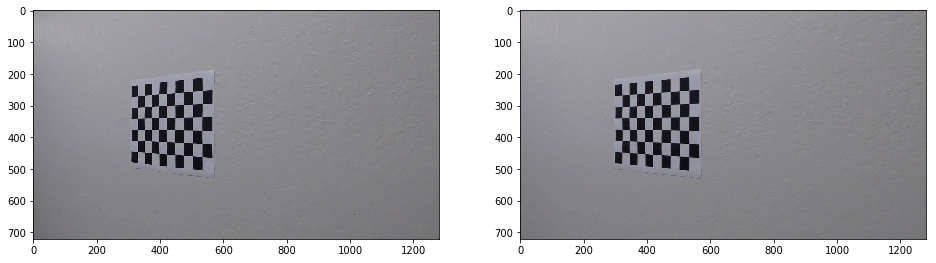

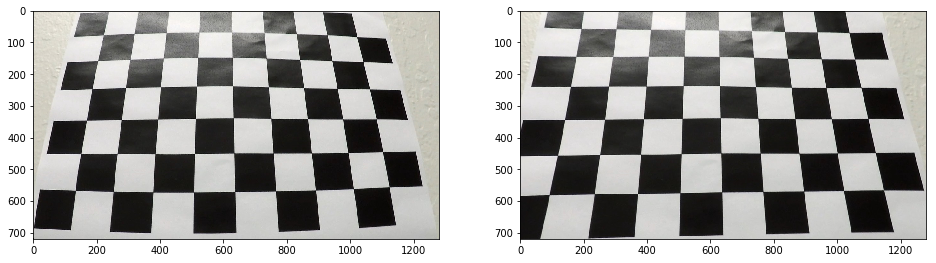

...

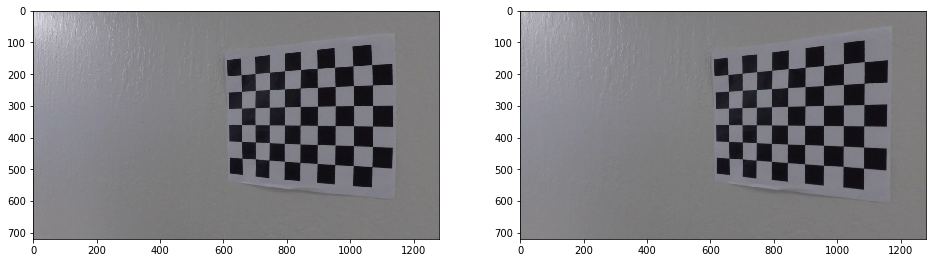

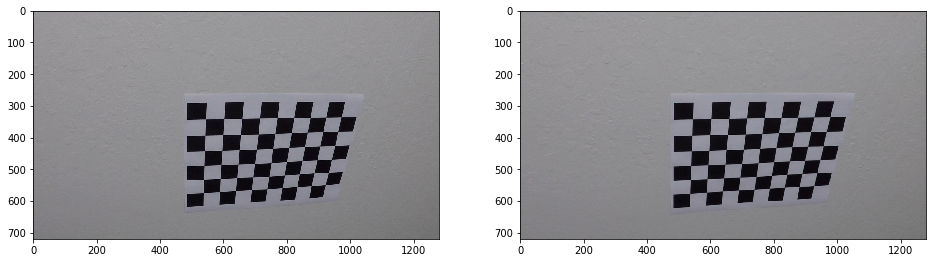

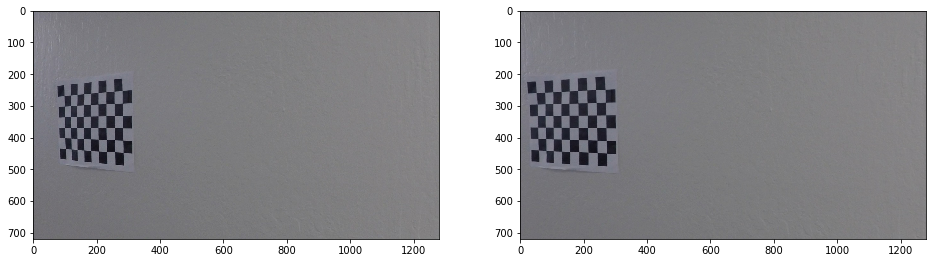

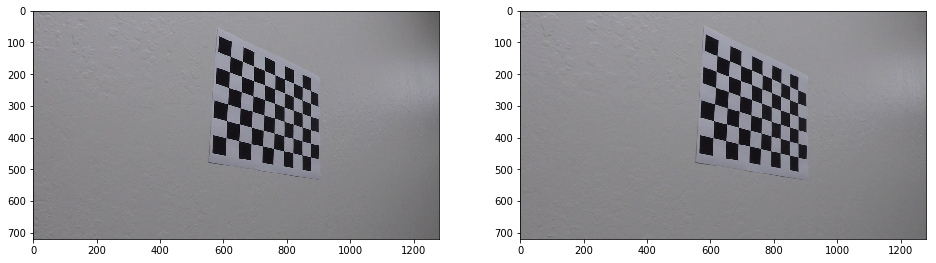

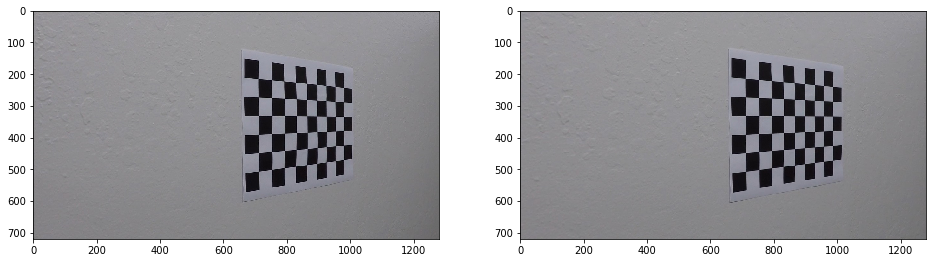

In [2]:
from pipeline import calibration, get_matrix, get_vanishing_point, yuv_select, LaneDetector, LanePipeLine
from glob import glob

ret, mtx, dist, rvecs, tvecs = calibration()

for img_nmae in glob('camera_cal/calibration*.jpg'):
    img = cv2.cvtColor(cv2.imread(img_nmae), cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(16,8))
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    ax = plt.subplot(1,2,1)
    plt.imshow(img)
    ax = plt.subplot(1,2,2)
    plt.imshow(dst)
    plt.show()

# Lane Detection - Preprocessing

Each image needs to be preprocessed for lane detection.  We want to perform transformations on the image inorder to highlight the lanes.  I did this though a combination on trying to file yellow and white portions of the image, and also looking for regions where the x-derivative is large.

## 1. Undistort Image

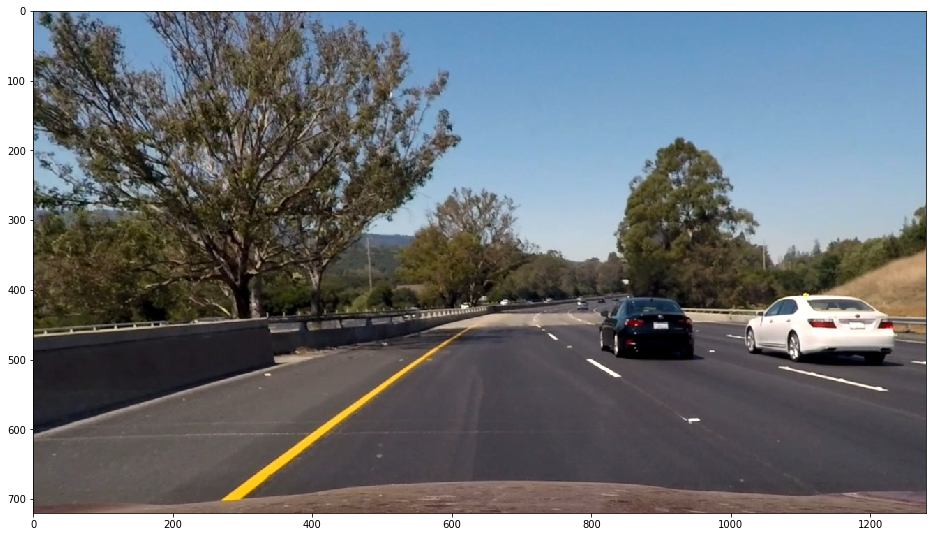

In [3]:
def undistort_image(img):
    return cv2.undistort(img, mtx, dist, None, mtx)

raw = cv2.cvtColor(cv2.imread('test_images/test6.jpg'), cv2.COLOR_BGR2RGB)
img = undistort_image(raw)

plt.figure(figsize=(16,16))
plt.imshow(img)
plt.show()

## 2. Select our bright and yellow areas

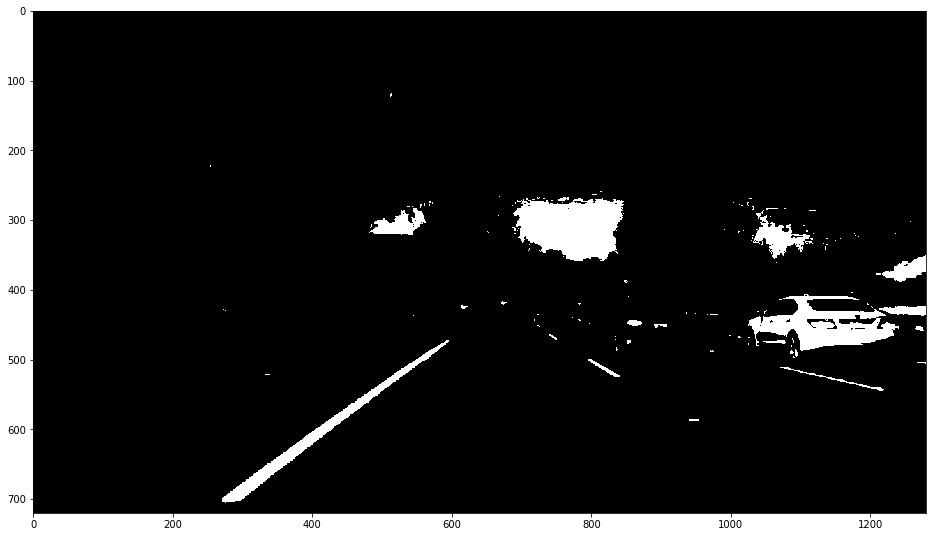

In [4]:
plt.figure(figsize=(16,16))
plt.imshow(yuv_select(img), cmap='gray')
plt.show()

The above image is used for lane detection in this project/pipeline.

# Warping

We now want to warp the image to proudce a top-down view of the lane inorder to detect the lanes.  For this We want to fine the vanishing point inorder to inform our perspective change.

Below is an a plot of looking for intersecting lines to identify the vanishing point for the image.

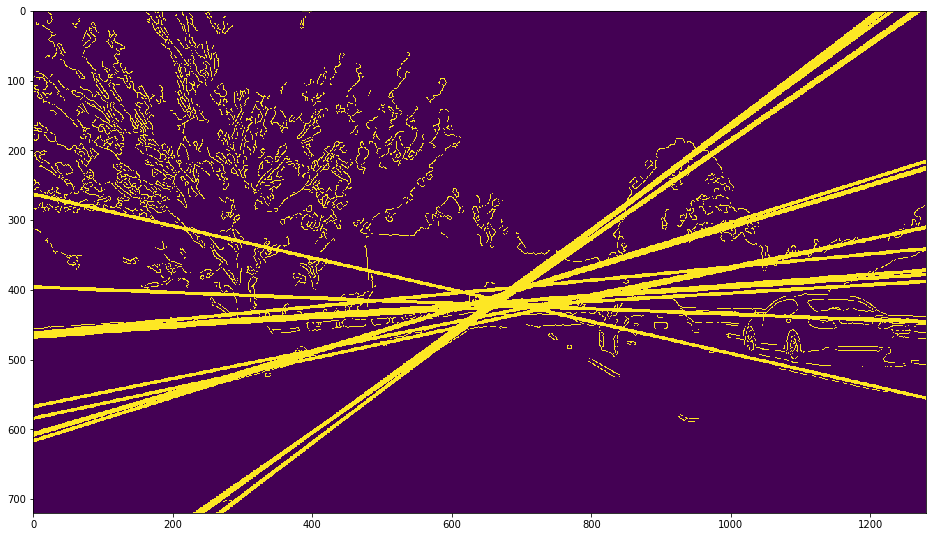

In [5]:
rho = 1
theta = np.pi/180
threshold = 1
min_line_len = 50
max_line_gap = 5
k_size = 5
kernel = np.ones((k_size,k_size),np.float32)/k_size**2

median = cv2.filter2D(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY),-1,kernel)
edge = cv2.Canny(median, 30,160)
lines = cv2.HoughLinesP(edge, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)

for line in lines:
    slope = (line[0,3]-line[0,1])/(line[0,2]-line[0,0])
    intercept = (line[0,3] - slope*line[0,2])
    if slope != 0 and np.isfinite(intercept):
        cv2.line(
            edge, 
            (0, int(intercept)), 
            (img.shape[1], int(img.shape[1]*slope+intercept)), 
            (255, 0, 0), 
            3
        )
plt.figure(figsize=(16,16))
plt.imshow(edge)
plt.show()

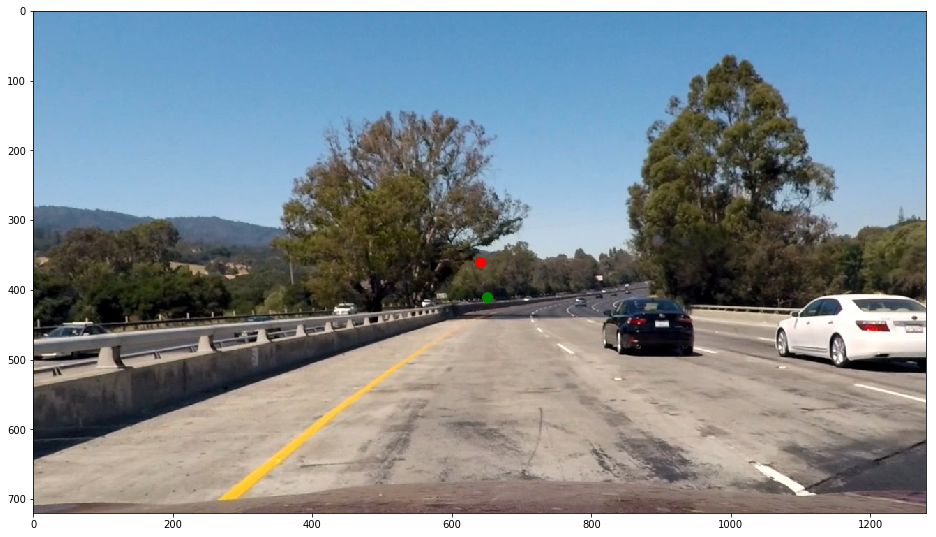

In [6]:
from pipeline import get_vanishing_point


x_vanish, y_vanish = get_vanishing_point(img)

for test_img in glob('test_images/test1.jpg'):
    raw = undistort_image(cv2.cvtColor(cv2.imread(test_img), cv2.COLOR_BGR2RGB))
    x_vanish, y_vanish = get_vanishing_point(raw)
    plt.figure(figsize=(16,16))
    plt.imshow(raw)
    plt.scatter([x_vanish],[y_vanish], s=100, c='green')
    plt.scatter([img.shape[1]//2],[img.shape[0]//2], s=100, c='red')
    plt.show()

Using the center of the image might not create a accurate warping.  You can see the vanishing point in green in the above plot, and the cneter of the image in red.   It is clear that lines do not vanish to the red point in this image.  

Using the vanishing point, we can create a bounding box for to warp based on the geometry from the vanishing point.  That box is shown below:

In [7]:
from pipeline import get_matrix

M, Minv = get_matrix(img, y_vanish, dy=40)
warped = cv2.warpPerspective(img, M, img.shape[:2][::-1])

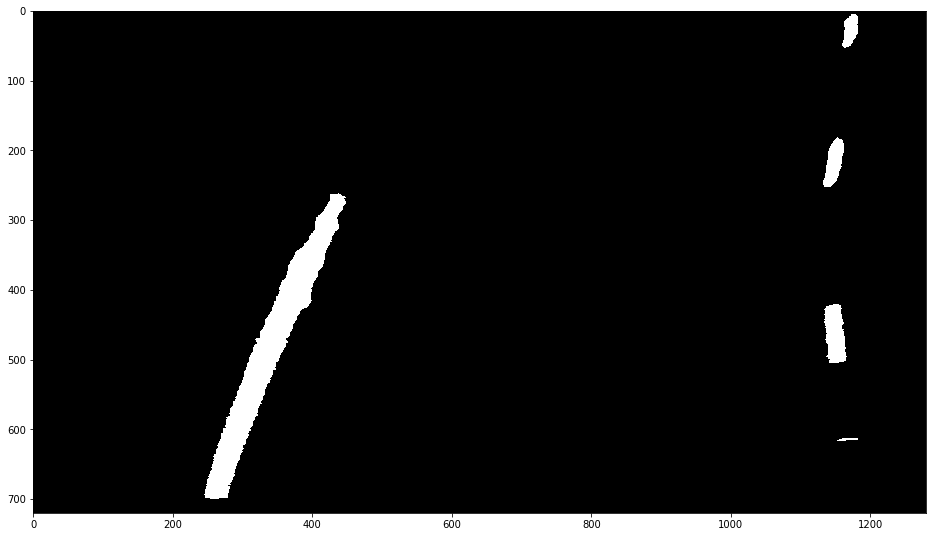

In [8]:
plt.figure(figsize=(16,16))
plt.imshow(yuv_select(warped), cmap='gray')
plt.show()


# Lane Detection

For this project I decided to fit the data using a constrain regression for the two polynomial lines.

$$  X = \begin{bmatrix} X_{left} & 0\\0 & X_{right}\end{bmatrix} $$  

Where a row in each matrix is represented by  $x_{left} = \begin{bmatrix} 1 \ y_p \ y^2_p \end{bmatrix}$ and $y_p$ is the y-position of non-zero pixels.

$$ Y = \begin{bmatrix} y_{left} \\ y_{right}\end{bmatrix} $$

Where a row the $Y$ matrix is is the corresponding x-position of a non-zero pixel.

The coefficients ($\beta$) for the fit can be solved using the following equation.

$$ \beta = \left( X^T \ X + \lambda \ \Lambda \right)^{-1} \ X^T \ Y$$

The $\lambda$ is term is a regularization value and $\Lambda$ is the regularization matrix that is a Gaussian prior on the fit.   In this case I am using the term to fulfill two purposes.  

1.  Regularize the second order term in the polyinomal to zero to avoid overfitting on the curvature
2.  Constrain the curvature of the two poly nomial to be similar.

To do this I am using this matrix for the regularization term.

$$ \Lambda = 
    \begin{bmatrix} 
    0 & 0 & 0 & 0 & 0 & 0 \\ 
    0 & 1 & 0 & 0 & -1 & 0 \\ 
    0 & 0 & 2 & 0 & 0 & -1 \\ 
    0 & 0 & 0 & 0 & 0 & 0 \\ 
    0 & -1 & 0 & 0 & 1 & 0 \\ 
    0 & 0 & 0 & -1 & 0 & 2 \\ 
 \end{bmatrix} $$

This term establises a prior that the first and second order terms of the polynomial should be the same (proxy for similar curvatures) and that the second order term should be zero.

## Fiting and Drawing Polynomial Fit

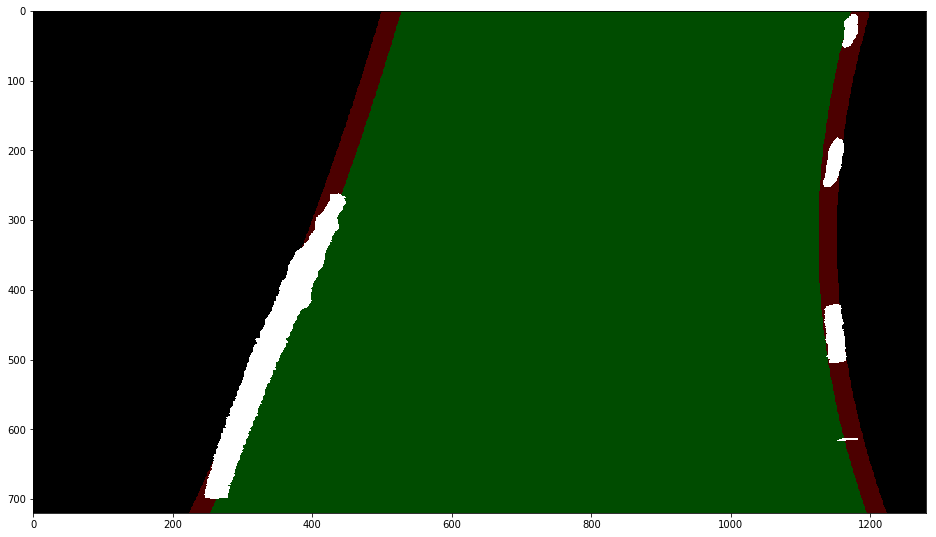

In [9]:
LD = LaneDetector(l2=1e6)
LD.update(yuv_select(warped))
overlay = LD.draw(yuv_select(warped))
#w = np.dstack([warped > 0]*3).astype(np.uint8)*255
result = cv2.addWeighted(np.dstack([yuv_select(warped)]*3)*255, 1, overlay, 0.3, 0)
plt.figure(figsize=(16,16))
plt.imshow(result)
plt.show()

From this overlay we can now reverse the perspective transform and overlay on the undistorted version of the image.

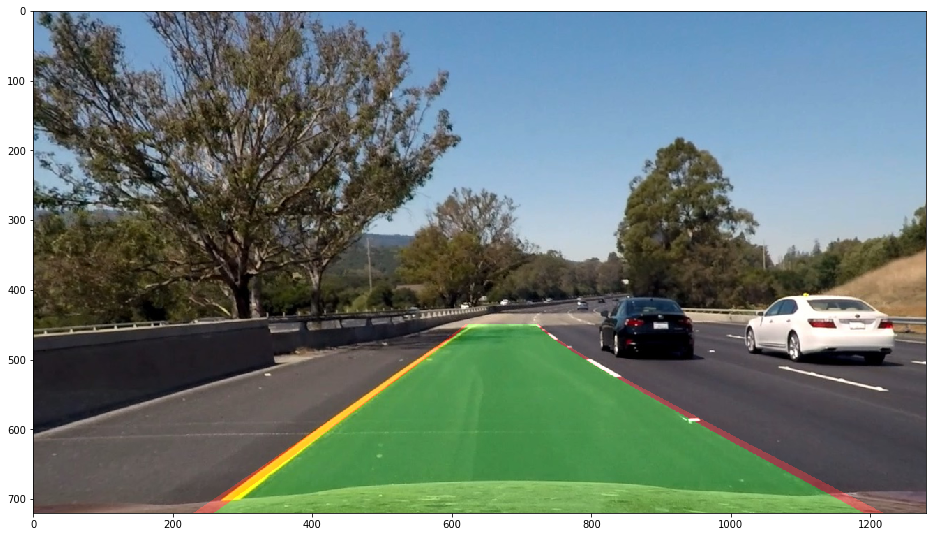

In [10]:
blank = np.zeros_like(img).astype(np.uint8)

overlay = cv2.warpPerspective(
    overlay, 
    Minv, 
    overlay.shape[:2][::-1]
)
result = cv2.addWeighted(img, 1, overlay, 0.3, 0)
plt.figure(figsize=(16,16))
plt.imshow(result)
plt.show()

# Transformation Pipeline

The primary goal of this project is to produce a pipline that can detect and overlay the detection of the lane on the video.  The process for this pipeline is to perform the following operations on each image sent through the pipeline:

1.  If pipline is not initalized
    1.  Detect Vanishing Points
    2.  Generate Perspective Matrixs
2.  Undistort the image from camera calibrations
3.  Transform image to highlight lane features
4.  Warp Transformed Image to Top-Perspecrtive
5.  Fit Lanes with Polynomial
    1.  Update Fit if Fit is valid
6.  Draw Current Fit of Lane Lines
7.  Transform back to undistorted perspective
8.  Overlay on Image

The following class is the implemntation of this pipeline.

## Desting Pipeline on single Test Image

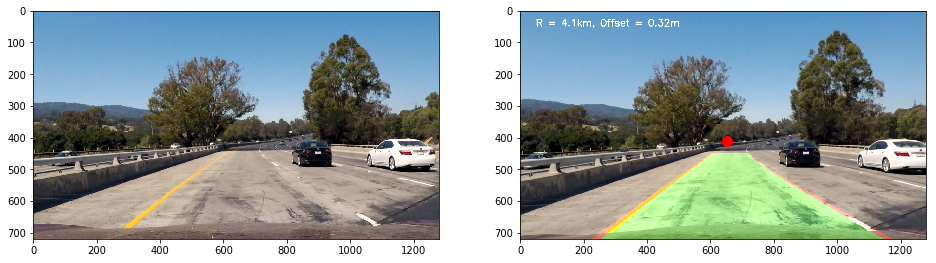

In [11]:
raw = cv2.cvtColor(cv2.imread('test_images/test1.jpg'), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(16,16))
ax = plt.subplot(1,2,1)
plt.imshow(raw)
ax = plt.subplot(1,2,2)
pipeline = LanePipeLine(mtx, dist)
plt.imshow(pipeline.transform(raw))
plt.scatter(pipeline.vanishing_pnt[0], pipeline.vanishing_pnt[1], color='red', s=100)
plt.show()

## Testing Pipeline on all Test Images

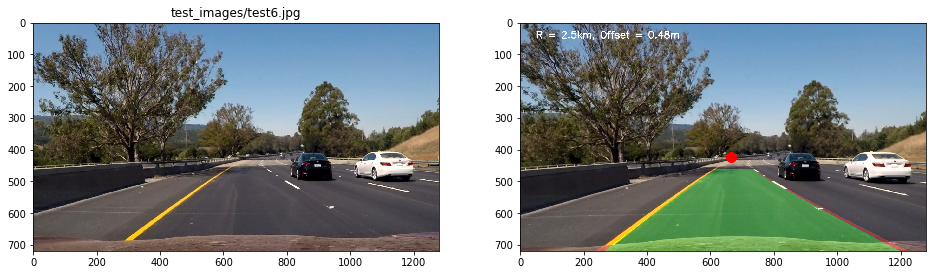

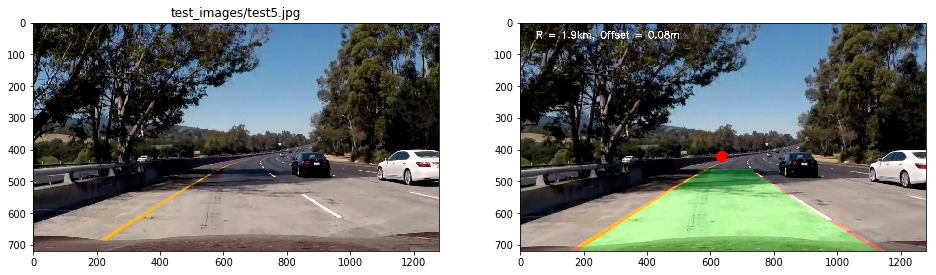

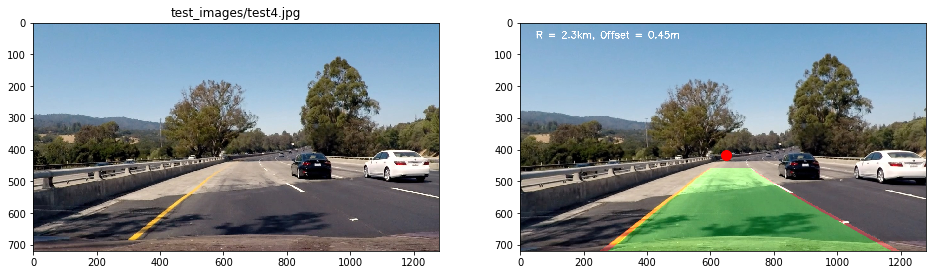

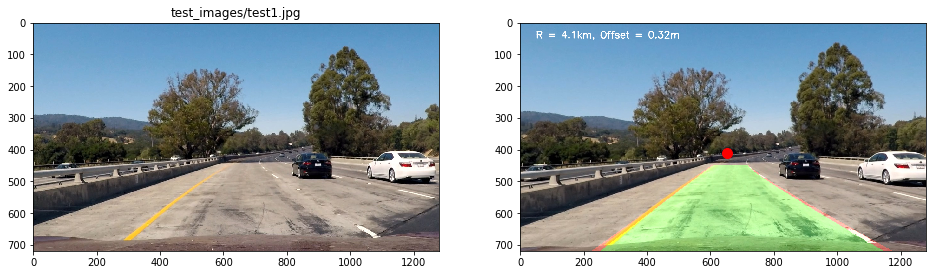

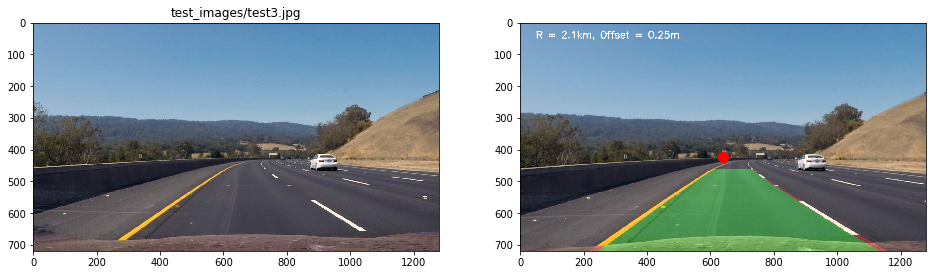

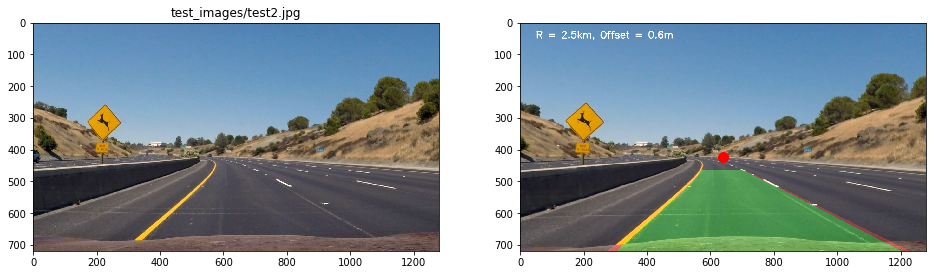

In [13]:
for test_img in glob('test_images/test*.jpg'):
    raw = cv2.cvtColor(cv2.imread(test_img), cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(16,16))
    
    ax = plt.subplot(1,2,1)
    plt.imshow(raw)
    plt.title(test_img)
    ax = plt.subplot(1,2,2)
    
    pipeline = LanePipeLine(mtx, dist)
    plt.imshow(pipeline.transform(raw))
    plt.scatter(pipeline.vanishing_pnt[0], pipeline.vanishing_pnt[1], color='red', s=100)
    plt.show()

The process does a good job on fiting the lane.  There is a litter difformation on test4.jpg.   This is not seen in the video because of the smoothing.

# Transform Movie of Driving

In [14]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

pipeline = LanePipeLine(mtx, dist)

def process_image(image):
    result = pipeline.transform(image)
    return result

project_output = 'project_video_transformed.mp4'
clip1 = VideoFileClip("project_video.mp4")
project_output_clip = clip1.fl_image(process_image)

%time project_output_clip.write_videofile(project_output, audio=False, codec='mpeg4')

[MoviePy] >>>> Building video project_video_transformed.mp4
[MoviePy] Writing video project_video_transformed.mp4


100%|█████████▉| 1260/1261 [01:29<00:00, 14.72it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_transformed.mp4 

CPU times: user 6min 25s, sys: 13.7 s, total: 6min 39s
Wall time: 1min 29s


# Improvements 

The video pipeline does well on the main video, but doe snot do well on the challenge videos.  In the challenge video, the binary_selector functio provided give a number of feature because of all the shadows, texture changes, and tire marks on the road.   Windowing would liklely help with my constrain regression, but I did not implement it for this project.

In the even harder video, the vanish point detection does a horrible job at finding the center of the image.  All of the warped images are very poor for fitting as a result.   

